In [1]:
#importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
print('Done')

Done


In [2]:
#reading the dataset into dataframe
df_data = pd.read_csv('creditcard.csv')
df_data.head(20)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,...,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,...,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


In [3]:
#getting number of rows and columns
df_data.shape

(284807, 31)

In [4]:
#checking the datatypes and how many they are
df_data.dtypes.value_counts()

float64    30
int64       1
Name: count, dtype: int64

In [5]:
#checking for any columns with null values
df_data.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

No missing values detected.

In [6]:
#to normalize all the data in the V column so that it will be in a scale of 0-1
# Collect all columns with the prefix "V" and store in a list
v_columns = [col for col in df_data.columns if col.startswith('V')]
#then iterate through the list
for v in v_columns:
    #normalize all the values in column starting with v
    df_data[v] = (df_data[v] - df_data[v].min()) / (df_data[v].max() - df_data[v].min())
df_data[v_columns].head(31)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
0,0.935192,0.766490,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,0.510600,...,0.594863,0.582942,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697
1,0.978542,0.770067,0.840298,0.271796,0.766120,0.262192,0.264875,0.786298,0.453981,0.505267,...,0.551930,0.579530,0.557840,0.480237,0.666938,0.336440,0.587290,0.446013,0.416345,0.313423
2,0.935217,0.753118,0.868141,0.268766,0.762329,0.281122,0.270177,0.788042,0.410603,0.513018,...,0.386683,0.585855,0.565477,0.546030,0.678939,0.289354,0.559515,0.402727,0.415489,0.311911
3,0.941878,0.765304,0.868484,0.213661,0.765647,0.275559,0.266803,0.789434,0.414999,0.507585,...,0.467058,0.578050,0.559734,0.510277,0.662607,0.223826,0.614245,0.389197,0.417669,0.314371
4,0.938617,0.776520,0.864251,0.269796,0.762975,0.263984,0.268968,0.782484,0.490950,0.524303,...,0.626060,0.584615,0.561327,0.547271,0.663392,0.401270,0.566343,0.507497,0.420561,0.317490
5,0.951057,0.777393,0.857187,0.244472,0.768550,0.262721,0.268257,0.788178,0.443190,0.501038,...,0.560723,0.581170,0.558122,0.483915,0.665042,0.332185,0.564839,0.442749,0.421196,0.314769
6,0.979184,0.768746,0.838200,0.305241,0.767008,0.265762,0.265324,0.786257,0.478797,0.506668,...,0.559756,0.577927,0.558776,0.497402,0.663145,0.277122,0.620014,0.383429,0.417148,0.313229
7,0.947348,0.782220,0.856031,0.230111,0.772104,0.267324,0.272183,0.744539,0.483978,0.534571,...,0.588656,0.578596,0.592809,0.462660,0.666288,0.294686,0.554597,0.417014,0.394234,0.291099
8,0.943101,0.770278,0.835452,0.239894,0.783688,0.300439,0.267610,0.794515,0.449275,0.500230,...,0.607853,0.580827,0.560296,0.497525,0.662401,0.518546,0.598855,0.362697,0.416728,0.316014
9,0.952547,0.779072,0.855511,0.242081,0.769078,0.260539,0.269325,0.786131,0.437401,0.501132,...,0.598594,0.582434,0.557499,0.480466,0.663640,0.330349,0.573992,0.440836,0.421056,0.314810


All values in the V column has been normalized.

In [7]:
#now viewing our dataset with the normalized columns
df_data.head(31)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,0.935192,0.766490,0.881365,0.313023,0.763439,0.267669,0.266815,0.786444,0.475312,...,0.561184,0.522992,0.663793,0.391253,0.585122,0.394557,0.418976,0.312697,149.62,0
1,0.0,0.978542,0.770067,0.840298,0.271796,0.766120,0.262192,0.264875,0.786298,0.453981,...,0.557840,0.480237,0.666938,0.336440,0.587290,0.446013,0.416345,0.313423,2.69,0
2,1.0,0.935217,0.753118,0.868141,0.268766,0.762329,0.281122,0.270177,0.788042,0.410603,...,0.565477,0.546030,0.678939,0.289354,0.559515,0.402727,0.415489,0.311911,378.66,0
3,1.0,0.941878,0.765304,0.868484,0.213661,0.765647,0.275559,0.266803,0.789434,0.414999,...,0.559734,0.510277,0.662607,0.223826,0.614245,0.389197,0.417669,0.314371,123.50,0
4,2.0,0.938617,0.776520,0.864251,0.269796,0.762975,0.263984,0.268968,0.782484,0.490950,...,0.561327,0.547271,0.663392,0.401270,0.566343,0.507497,0.420561,0.317490,69.99,0
5,2.0,0.951057,0.777393,0.857187,0.244472,0.768550,0.262721,0.268257,0.788178,0.443190,...,0.558122,0.483915,0.665042,0.332185,0.564839,0.442749,0.421196,0.314769,3.67,0
6,4.0,0.979184,0.768746,0.838200,0.305241,0.767008,0.265762,0.265324,0.786257,0.478797,...,0.558776,0.497402,0.663145,0.277122,0.620014,0.383429,0.417148,0.313229,4.99,0
7,7.0,0.947348,0.782220,0.856031,0.230111,0.772104,0.267324,0.272183,0.744539,0.483978,...,0.592809,0.462660,0.666288,0.294686,0.554597,0.417014,0.394234,0.291099,40.80,0
8,7.0,0.943101,0.770278,0.835452,0.239894,0.783688,0.300439,0.267610,0.794515,0.449275,...,0.560296,0.497525,0.662401,0.518546,0.598855,0.362697,0.416728,0.316014,93.20,0
9,9.0,0.952547,0.779072,0.855511,0.242081,0.769078,0.260539,0.269325,0.786131,0.437401,...,0.557499,0.480466,0.663640,0.330349,0.573992,0.440836,0.421056,0.314810,3.68,0


In [8]:
#describing the resulting dataset
df_data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,...,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000
mean,94813.859575,0.958294,0.767258,0.837414,0.251930,0.765716,0.263020,0.265356,0.785385,0.462780,...,0.561480,0.510031,0.665434,0.382234,0.577907,0.425448,0.416511,0.313124,88.349619,0.001727
std,47488.145955,0.033276,0.017424,0.026275,0.062764,0.009292,0.013395,0.007537,0.012812,0.037846,...,0.011841,0.033854,0.009274,0.081611,0.029261,0.078771,0.007450,0.006698,250.120109,0.041527
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,54201.500000,0.942658,0.760943,0.821985,0.214311,0.761060,0.255295,0.261980,0.783148,0.440626,...,0.557798,0.484730,0.663030,0.334454,0.560104,0.372036,0.415203,0.312049,5.600000,0.000000
50%,84692.000000,0.958601,0.767949,0.840530,0.251050,0.765351,0.260263,0.265600,0.785625,0.461008,...,0.561005,0.510347,0.665267,0.387756,0.578838,0.416932,0.416536,0.313352,22.000000,0.000000
75%,139320.500000,0.980645,0.775739,0.855213,0.284882,0.769836,0.267027,0.268831,0.788897,0.483350,...,0.564484,0.534688,0.667626,0.441460,0.597593,0.464807,0.418191,0.314712,77.165000,0.000000
max,172792.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,25691.160000,1.000000


We can see that all V columns have been normalized within a min_scale of 0 and max_scale of 1

Now is to conduct Exploratory Data Analysis

In [9]:
df_data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,...,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000
mean,94813.859575,0.958294,0.767258,0.837414,0.251930,0.765716,0.263020,0.265356,0.785385,0.462780,...,0.561480,0.510031,0.665434,0.382234,0.577907,0.425448,0.416511,0.313124,88.349619,0.001727
std,47488.145955,0.033276,0.017424,0.026275,0.062764,0.009292,0.013395,0.007537,0.012812,0.037846,...,0.011841,0.033854,0.009274,0.081611,0.029261,0.078771,0.007450,0.006698,250.120109,0.041527
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,54201.500000,0.942658,0.760943,0.821985,0.214311,0.761060,0.255295,0.261980,0.783148,0.440626,...,0.557798,0.484730,0.663030,0.334454,0.560104,0.372036,0.415203,0.312049,5.600000,0.000000
50%,84692.000000,0.958601,0.767949,0.840530,0.251050,0.765351,0.260263,0.265600,0.785625,0.461008,...,0.561005,0.510347,0.665267,0.387756,0.578838,0.416932,0.416536,0.313352,22.000000,0.000000
75%,139320.500000,0.980645,0.775739,0.855213,0.284882,0.769836,0.267027,0.268831,0.788897,0.483350,...,0.564484,0.534688,0.667626,0.441460,0.597593,0.464807,0.418191,0.314712,77.165000,0.000000
max,172792.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,25691.160000,1.000000


In [10]:
df_data.dtypes.value_counts()

float64    30
int64       1
Name: count, dtype: int64

In [11]:
#plotting a pie chart to visualize the class distribution with a fig size
fig = px.pie(data_frame= df_data, names='Class', title='Disribution of classes', height=500, width=500)
fig.show()

<Axes: >

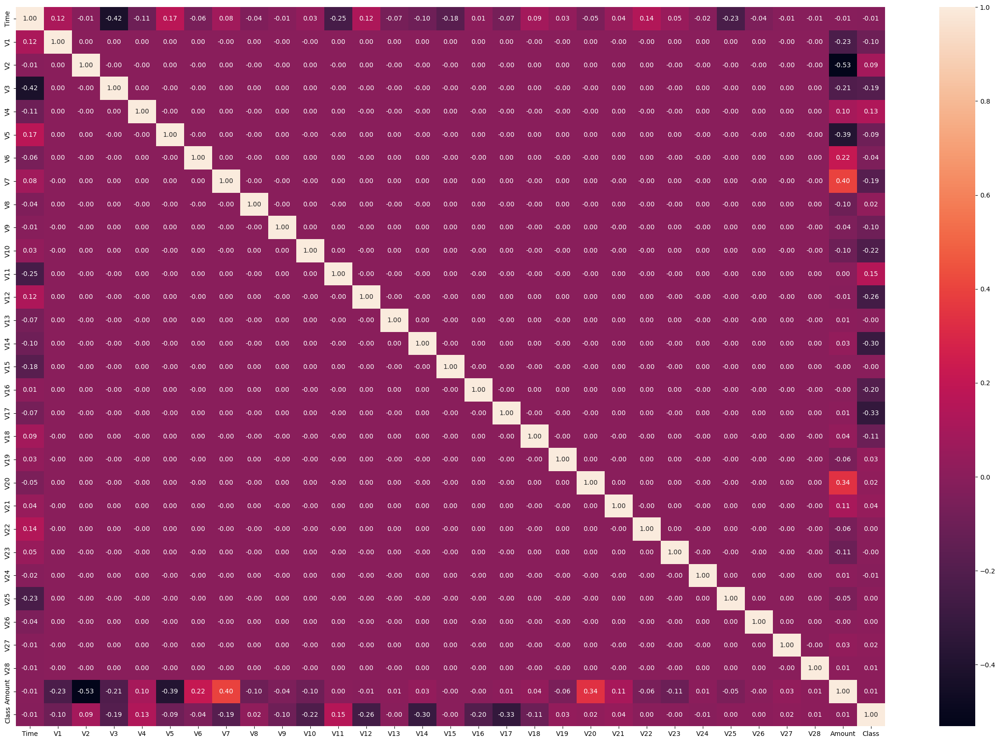

In [12]:
#visualizing the correlation values
plt.figure(figsize=(30,20))
sns.heatmap(df_data.corr(),cbar = 'coolwarm', annot = True, fmt = "0.2f")

In [13]:
#splitting the dataset into features and target as x and y respectively dataset
x = df_data.drop('Class', axis=1)
y = df_data['Class']

In [14]:
#importing classification algorithm
from sklearn.linear_model import LogisticRegression

In [15]:
#importing train_test_split
from sklearn.model_selection import train_test_split

# Splitting the dataset into 80% training and 20% testing
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


In [16]:
#checking the value count of our training class so as to check for imbalance
y_train.value_counts()

Class
0    227451
1       394
Name: count, dtype: int64

In [17]:
#Doing some mathematics to display their individual percentage
zero = y_train.value_counts()[0]
one = y_train.value_counts() [1]

#calculate the percentage of fraudulent transactions
percentage_of_zero_count = round((zero / (zero + one)) * 100, 2)
percentage_of_one_count = round((one / (zero + one)) * 100, 2)
print('The percentage of 0 (Genuine) in the Class column is ', percentage_of_zero_count, '% while that of 1 (Fraud) is ', percentage_of_one_count, '%')

The percentage of 0 (Genuine) in the Class column is  99.83 % while that of 1 (Fraud) is  0.17 %


We can see that there is a class imbalance occuring in the class column, it needs to be handled to avoid model bias

In [18]:
#importing SMOTE
from imblearn.over_sampling import SMOTE

# Create an instance of SMOTE
smote = SMOTE(random_state=42)

# Resample the training data
x_train_sm, y_train_sm = smote.fit_resample(x_train, y_train)

# Check the class distribution after resampling
print("Before resampling:")
print(y_train.value_counts())

print("\nAfter resampling (SMOTE):")
print(y_train_sm.value_counts())

Before resampling:
Class
0    227451
1       394
Name: count, dtype: int64

After resampling (SMOTE):
Class
0    227451
1    227451
Name: count, dtype: int64


In [19]:
# Visualizing y_train_sm in a pie chart
fig = px.pie(data_frame=pd.DataFrame(y_train, columns=['Class']), names='Class', title='Distribution of classes in y_train before resampling', height=500, width=500)
fig.show()

In [20]:
# Visualizing y_train_sm in a pie chart
fig = px.pie(data_frame=pd.DataFrame(y_train_sm, columns=['Class']), names='Class', title='Distribution of classes in y_train after resampling', height=500, width=500)
fig.show()

In [21]:
#assigning the model object to a variable
model = LogisticRegression(max_iter=350000)
# Train the model with the resampled data
model.fit(x_train_sm, y_train_sm)
y_pred_test = model.predict(x_test)

#importing metrics
from sklearn import metrics
print('Mean absolute error:', round(metrics.mean_absolute_error(y_test, y_pred_test), 2))
print('Mean squared error:', round(metrics.mean_squared_error(y_test, y_pred_test), 2))
print('Root mean squared error:', round(np.sqrt(metrics.mean_squared_error(y_test, y_pred_test)), 2))
print('The accuracy score: ',round(metrics.accuracy_score(y_test, y_pred_test)*100, 2),  '%')


Mean absolute error: 0.01
Mean squared error: 0.01
Root mean squared error: 0.11
The accuracy score:  98.88 %


Text(0.5, 1.0, 'Evaluation of model using Visualization')

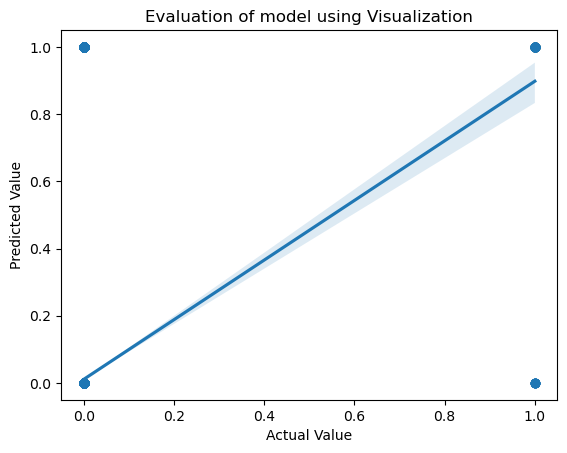

In [22]:
#Evaluating our model using data visualization
sns.regplot(x=y_test, y=y_pred_test, data=None)
plt.xlabel('Actual Value')
plt.ylabel('Predicted Value')
plt.title('Evaluation of model using Visualization')

In [23]:
#evaluating our model using F1-score, recall and precision score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
f1_score(y_test, y_pred_test, average='macro')
print('The F1-score of the model is ', round(f1_score(y_test, y_pred_test, average='macro')*100, 2),  '%')


recall_score(y_test, y_pred_test, average='macro')
print('The recall score of the model is ', round(recall_score(y_test, y_pred_test, average='macro')*100, 2),  '%')


precision_score(y_test, y_pred_test, average='macro')
print('The precision score of the model is ', round(precision_score(y_test, y_pred_test, average='macro')*100, 2),  '%')

The F1-score of the model is  60.5 %
The recall score of the model is  94.34 %
The precision score of the model is  56.12 %


In [24]:
#using our model to make a prediction

input_data = [[15.0, -0.0183, 0.0538, -0.0403, 0.0159, 0.0166, 0.0389, -0.0061, -0.0013, 0.0192, 0.0171, 0.0066, 0.0101, -0.0031, 0.0089, -0.0175, 0.0069, 0.0007, 0.0108, 0.0038, 0.0082, 0.0017, 0.0049, 0.0015, 0.4567, 0.4635, 0.3654, 0.3763, 0.3736, 1364]]
data_array = np.asarray(input_data)
reshaped_data = data_array.reshape(1, -1)
prediction = model.predict(reshaped_data)
if prediction == 1:
    print('Fraudulent transaction!😬')
else:
    print('Genuine transaction.😊')

Fraudulent transaction!😬
